# Text-to-Image Generation with Diffusion Models

## Abstract

This notebook explores the fascinating world of text-to-image generation using diffusion models, a powerful class of generative AI that has revolutionized image synthesis. Readers will learn about the underlying principles of diffusion models, their architecture, training methodology, and practical applications. By the end of this notebook, you will understand how these models transform text descriptions into high-quality images and be able to implement a basic text-to-image generation system using pre-trained models. We'll cover both the theoretical foundations and provide hands-on code examples to demonstrate the capabilities of these cutting-edge generative models.

## 1. Introduction to Diffusion Models

Diffusion models represent a class of generative models that have gained significant attention in recent years, particularly for their impressive results in image generation tasks. Unlike GANs (Generative Adversarial Networks) or VAEs (Variational Autoencoders), diffusion models work by gradually adding noise to data and then learning to reverse this process.

### 1.1 Core Concept

The fundamental idea behind diffusion models is to define a forward diffusion process that gradually adds noise to data until it becomes pure noise, and then learn a reverse diffusion process that can transform noise back into data. This approach is inspired by non-equilibrium thermodynamics.

### 1.2 Key Advantages of Diffusion Models

- **High-quality outputs**: Diffusion models can generate images with remarkable fidelity and detail
- **Training stability**: Unlike GANs, diffusion models tend to be more stable during training
- **Diverse outputs**: They can generate diverse samples without mode collapse
- **Controllable generation**: They allow for fine-grained control over the generation process
- **Strong conditioning**: They excel at conditional generation tasks like text-to-image synthesis

Let's begin by installing the necessary libraries for our exploration.

In [2]:
# Install required packages (run this cell first)
!pip install diffusers transformers torch accelerate ftfy matplotlib ipywidgets
!pip install open-clip-torch


[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Import necessary libraries
import torch
from diffusers import StableDiffusionPipeline
from transformers import CLIPTextModel, CLIPTokenizer
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, clear_output
import ipywidgets as widgets
from PIL import Image
import time

## 2. Theory: Understanding Diffusion Models

### 2.1 The Diffusion Process

Diffusion models operate on a fundamental principle of gradually adding Gaussian noise to data in a forward process and then learning to reverse this process. This can be broken down into two key phases:

#### Forward Diffusion Process

In the forward process, we start with a data point $x_0$ (e.g., an image) and progressively add Gaussian noise over $T$ time steps, resulting in increasingly noisy versions $x_1, x_2, ..., x_T$.

At each step $t$, we have:

$$q(x_t | x_{t-1}) = \mathcal{N}(x_t; \sqrt{1 - \beta_t} x_{t-1}, \beta_t I)$$

Where $\beta_t$ is a variance schedule that controls the noise level added at each step.

An important property is that we can sample $x_t$ directly from $x_0$ using:

$$x_t = \sqrt{\bar{\alpha}_t} x_0 + \sqrt{1 - \bar{\alpha}_t} \epsilon$$

Where $\epsilon \sim \mathcal{N}(0, I)$ and $\bar{\alpha}_t = \prod_{i=1}^t (1 - \beta_i)$

#### Reverse Diffusion Process

The goal of training is to learn the reverse process, which gradually removes noise to transform pure noise into a data sample. We learn to predict the parameters of:

$$p_\theta(x_{t-1} | x_t) = \mathcal{N}(x_{t-1}; \mu_\theta(x_t, t), \Sigma_\theta(x_t, t))$$

In practice, this is often simplified to predicting the noise $\epsilon$ that was added, using a neural network $\epsilon_\theta(x_t, t)$.

### 2.2 Architecture of Diffusion Models

The backbone of most diffusion models for image generation is a U-Net architecture with the following key components:

1. **Convolutional Layers**: Process spatial information in the image
2. **Time Embedding**: Incorporates the diffusion timestep information
3. **Attention Mechanisms**: Allow for global context and better long-range dependencies
4. **Residual Connections**: Help with gradient flow during training
5. **Conditioning Mechanisms**: Enable text-conditioning through cross-attention

### 2.3 Text Conditioning

Text-to-image diffusion models incorporate text conditioning through:

1. **Text Encoder**: Often using models like CLIP to convert text into embeddings
2. **Cross-Attention**: Allowing the diffusion model to attend to relevant parts of the text embedding
3. **Classifier-Free Guidance**: A technique to strengthen the conditioning signal

The model learns to associate text features with corresponding image features during training, enabling it to generate images that match textual descriptions during inference.

### 2.4 Training Methodology

Training a diffusion model involves minimizing a variational bound on the negative log-likelihood. In practice, this is often simplified to a denoising score matching objective, where the model learns to predict the noise that was added to the image.

The loss function can be written as:

$$L = \mathbb{E}_{t, x_0, \epsilon} \left[ \| \epsilon - \epsilon_\theta(x_t, t, c) \|^2 \right]$$

Where:
- $t$ is sampled uniformly from $1$ to $T$
- $x_0$ is a real image from the training dataset
- $\epsilon$ is random noise sampled from $\mathcal{N}(0, I)$
- $x_t$ is the noised version of $x_0$ at timestep $t$
- $c$ is the conditioning information (e.g., text embeddings)

### 2.5 Sampling (Inference)

During inference, we start with pure noise $x_T \sim \mathcal{N}(0, I)$ and iteratively refine it using our trained model. At each step, we predict the noise component and remove it:

$$x_{t-1} = \frac{1}{\sqrt{1-\beta_t}}\left(x_t - \frac{\beta_t}{\sqrt{1-\bar{\alpha}_t}}\epsilon_\theta(x_t, t, c)\right) + \sigma_t z$$

Where $z \sim \mathcal{N}(0, I)$ is random noise added for stochasticity, and $\sigma_t$ controls the amount of noise in each step.

### 2.6 Classifier-Free Guidance

A key technique used in text-to-image models is classifier-free guidance, which enhances text conditioning without requiring a separate classifier. The noise prediction becomes:

$$\hat{\epsilon}_\theta(x_t, t, c) = \epsilon_\theta(x_t, t) + s \cdot (\epsilon_\theta(x_t, t, c) - \epsilon_\theta(x_t, t))$$

Where $s > 1$ is the guidance scale that controls how closely the generated image follows the text prompt.

## 3. Practical Implementation: Text-to-Image Generation

Now let's implement text-to-image generation using a pre-trained diffusion model. We'll use Hugging Face's implementation of Stable Diffusion, a popular text-to-image diffusion model.

In [4]:
# Load a pre-trained Stable Diffusion model
# Note: This will download the model weights if they aren't already cached
model_id = "stabilityai/stable-diffusion-2-1-base"

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Load Stable Diffusion pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    safety_checker=None  # For educational purposes only
)
pipe = pipe.to(device)

# Enable attention slicing for lower memory usage
pipe.enable_attention_slicing()

Using device: cuda


model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

C:\Users\deepa\Documents\Repo\diffusion_project\fresh_env\Lib\site-packages\huggingface_hub\file_download.py:144: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\deepa\.cache\huggingface\hub\models--stabilityai--stable-diffusion-2-1-base. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


config.json:   0%|          | 0.00/911 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

### 3.1 Basic Image Generation

Let's start with a simple example of generating an image from a text prompt:

In [5]:
def generate_and_display_image(prompt, guidance_scale=7.5, num_inference_steps=50, seed=None):
    """
    Generate and display an image based on a text prompt
    
    Args:
        prompt (str): The text prompt
        guidance_scale (float): Controls how much the image generation follows the text
        num_inference_steps (int): Number of denoising steps
        seed (int, optional): Random seed for reproducibility
    
    Returns:
        PIL.Image: The generated image
    """
    # Set random seed if provided
    if seed is not None:
        generator = torch.Generator(device=device).manual_seed(seed)
    else:
        generator = None
    
    # Generate image
    start_time = time.time()
    image = pipe(prompt, 
                 guidance_scale=guidance_scale,
                 num_inference_steps=num_inference_steps,
                 generator=generator).images[0]
    end_time = time.time()
    
    # Display image with prompt and generation info
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Prompt: {prompt}\nGuidance Scale: {guidance_scale}, Steps: {num_inference_steps}\nGeneration Time: {end_time - start_time:.2f}s", fontsize=12)
    plt.show()
    
    return image

  0%|          | 0/30 [00:00<?, ?it/s]

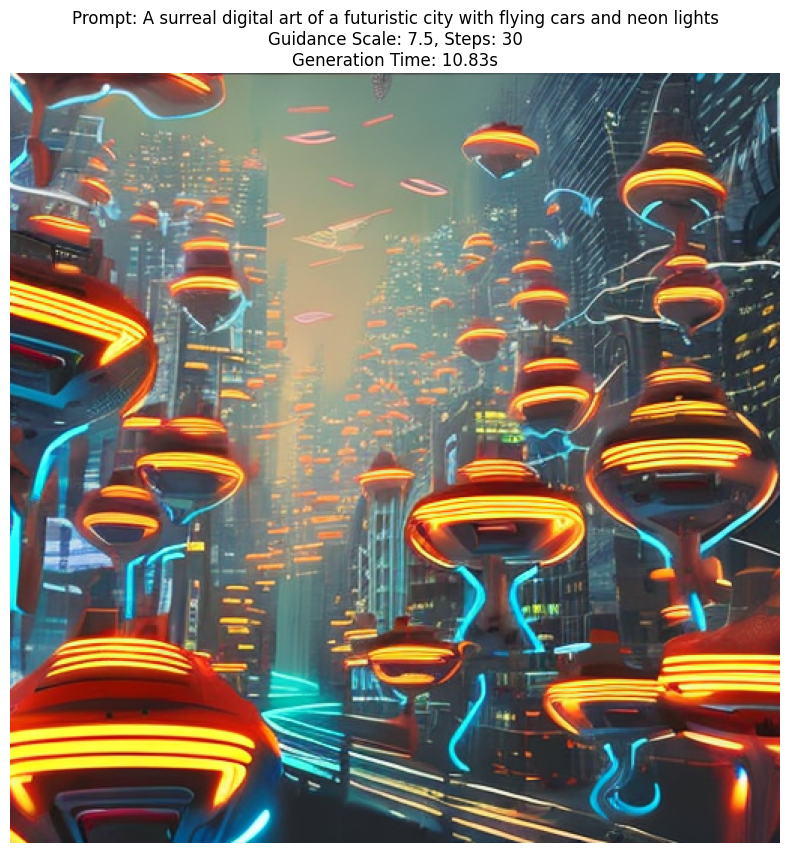

In [6]:
# Generate an image from a text prompt
prompt = "A surreal digital art of a futuristic city with flying cars and neon lights"
image = generate_and_display_image(prompt, guidance_scale=7.5, num_inference_steps=30, seed=42)

### 3.2 Interactive Image Generation

Let's create an interactive widget that allows us to experiment with different prompts and parameters:

In [7]:
# Create interactive widgets
prompt_input = widgets.Text(
    value="A beautiful landscape with mountains and a lake at sunset",
    description="Prompt:",
    layout=widgets.Layout(width="100%")
)

guidance_slider = widgets.FloatSlider(
    value=7.5,
    min=1.0,
    max=15.0,
    step=0.5,
    description="Guidance:",
    tooltip="Higher values make the image more closely follow the prompt"
)

steps_slider = widgets.IntSlider(
    value=30,
    min=10,
    max=100,
    step=5,
    description="Steps:",
    tooltip="More steps = higher quality but slower generation"
)

seed_input = widgets.Text(
    value="",
    description="Seed:",
    placeholder="Random if empty",
    tooltip="Enter a number for reproducible results"
)

generate_button = widgets.Button(
    description="Generate Image",
    button_style="primary",
    tooltip="Click to generate an image"
)

output = widgets.Output()

# Define the generate function
def on_generate_button_clicked(b):
    with output:
        clear_output()
        print("Generating image...")
        
        # Get seed value if provided
        seed_val = None
        if seed_input.value:
            try:
                seed_val = int(seed_input.value)
            except ValueError:
                print("Invalid seed value. Using random seed.")
        
        # Generate image with the specified parameters
        generate_and_display_image(
            prompt=prompt_input.value,
            guidance_scale=guidance_slider.value,
            num_inference_steps=steps_slider.value,
            seed=seed_val
        )

# Connect the button click event to the function
generate_button.on_click(on_generate_button_clicked)

# Display the interactive widgets
display(prompt_input, widgets.HBox([guidance_slider, steps_slider, seed_input]), generate_button, output)

Text(value='A beautiful landscape with mountains and a lake at sunset', description='Prompt:', layout=Layout(w…

Button(button_style='primary', description='Generate Image', style=ButtonStyle(), tooltip='Click to generate a…

Output()

### 3.3 Exploring Diffusion Sampling Process

Let's visualize the diffusion process by displaying the intermediate steps of image generation. This will give us insight into how the model progressively refines noise into a coherent image.

In [8]:
# Customize the pipeline to return intermediate steps
from diffusers.pipelines.stable_diffusion import StableDiffusionPipelineOutput

# Store intermediate images
intermediate_images = []

# Define a callback function to store images
def store_intermediate(step, timestep, latents):
    # Convert latents to image
    with torch.no_grad():
        latents = 1 / 0.18215 * latents
        image = pipe.vae.decode(latents).sample
        image = (image / 2 + 0.5).clamp(0, 1)
        # Convert to numpy array
        image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
        intermediate_images.append(image)
    
    # Return True to continue the process
    return True

def visualize_generation_process(prompt, num_inference_steps=30, guidance_scale=7.5, seed=42):
    # Clear the previous results
    global intermediate_images
    intermediate_images = []
    
    # Set random seed for reproducibility
    generator = torch.Generator(device=device).manual_seed(seed)
    
    # Generate image with callback to store intermediate results
    _ = pipe(
        prompt,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=generator,
        callback=store_intermediate,
        callback_steps=1  # Store every step
    )
    
    # Select steps to display (to avoid too many images)
    steps_to_show = sorted(set([
        0,  # First step (noise)
        len(intermediate_images) // 4,  # 25%
        len(intermediate_images) // 2,  # 50%
        3 * len(intermediate_images) // 4,  # 75%
        len(intermediate_images) - 1  # Final image
    ]))
    
    # Display selected intermediate results
    fig, axes = plt.subplots(1, len(steps_to_show), figsize=(15, 4))
    
    for i, step_idx in enumerate(steps_to_show):
        img = intermediate_images[step_idx]
        axes[i].imshow(img)
        axes[i].set_title(f"Step {step_idx}")
        axes[i].axis('off')
    
    plt.suptitle(f"Diffusion Process for: {prompt}", fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Create a detailed animation
    fig, ax = plt.subplots(figsize=(8, 8))
    
    def animate(i):
        ax.clear()
        ax.imshow(intermediate_images[i])
        ax.set_title(f"Step {i}/{len(intermediate_images)-1}")
        ax.axis('off')
    
    # Use interactive widget to browse through steps
    step_slider = widgets.IntSlider(
        value=0,
        min=0,
        max=len(intermediate_images)-1,
        step=1,
        description="Step:",
        layout=widgets.Layout(width='80%')
    )
    
    # Connect the slider to the animation function
    widgets.interact(animate, i=step_slider)
    
    plt.close()  # Close the first figure to avoid displaying it twice

C:\Users\deepa\Documents\Repo\diffusion_project\fresh_env\Lib\site-packages\diffusers\pipelines\stable_diffusion\pipeline_stable_diffusion.py:899: FutureWarning: `callback` is deprecated and will be removed in version 1.0.0. Passing `callback` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`
  deprecate(
C:\Users\deepa\Documents\Repo\diffusion_project\fresh_env\Lib\site-packages\diffusers\pipelines\stable_diffusion\pipeline_stable_diffusion.py:905: FutureWarning: `callback_steps` is deprecated and will be removed in version 1.0.0. Passing `callback_steps` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`
  deprecate(


  0%|          | 0/30 [00:00<?, ?it/s]

ValueError: arrays must be of dtype byte, short, float32 or float64

<Figure size 1500x400 with 5 Axes>

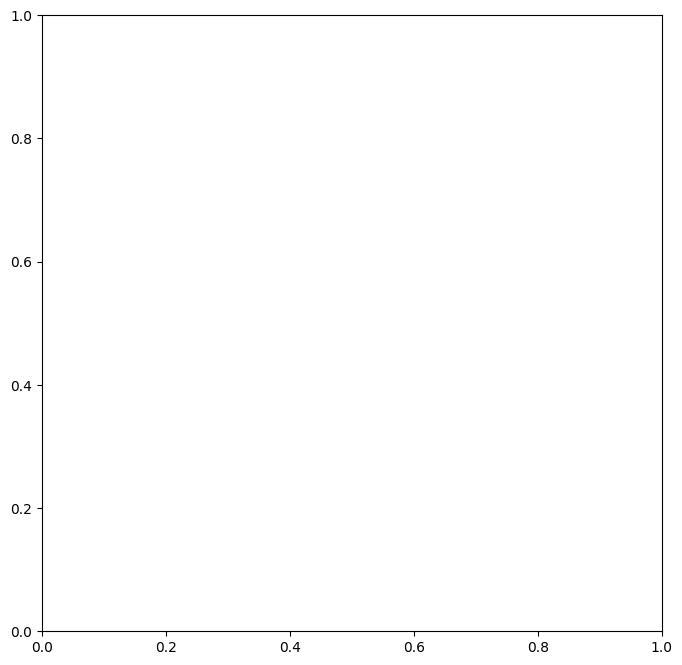

interactive(children=(IntSlider(value=0, description='Step:', layout=Layout(width='80%'), max=29), Output()), …

In [9]:
# Visualize the diffusion process
prompt = "A majestic castle on a hill with a rainbow in the sky"
visualize_generation_process(prompt, num_inference_steps=30, seed=12345)

### 3.4 Exploring Text Conditioning

Let's examine how the text prompt influences the generated image by comparing different descriptions while keeping the random seed constant.

In [10]:
def compare_prompts(prompts, seed=42, guidance_scale=7.5, num_inference_steps=30):
    """
    Generate and compare images from different prompts using the same seed
    
    Args:
        prompts (list): List of text prompts to compare
        seed (int): Random seed for reproducibility
        guidance_scale (float): Controls how much the image generation follows the text
        num_inference_steps (int): Number of denoising steps
    """
    # Set the same random seed for all generations
    generator = torch.Generator(device=device).manual_seed(seed)
    
    # Calculate grid dimensions
    n = len(prompts)
    cols = min(3, n)  # Maximum 3 columns
    rows = (n + cols - 1) // cols  # Ceiling division
    
    # Generate and display images
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    if rows == 1 and cols == 1:
        axes = np.array([axes])  # Ensure axes is always iterable
    axes = axes.flatten()
    
    for i, prompt in enumerate(prompts):
        # Generate image with the same seed
        generator = torch.Generator(device=device).manual_seed(seed)
        image = pipe(
            prompt,
            guidance_scale=guidance_scale,
            num_inference_steps=num_inference_steps,
            generator=generator
        ).images[0]
        
        # Display image
        axes[i].imshow(image)
        axes[i].set_title(prompt, fontsize=10)
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
        fig.delaxes(axes[j])
    
    plt.suptitle(f"Comparing Different Prompts (Seed: {seed}, Guidance: {guidance_scale})", fontsize=14)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

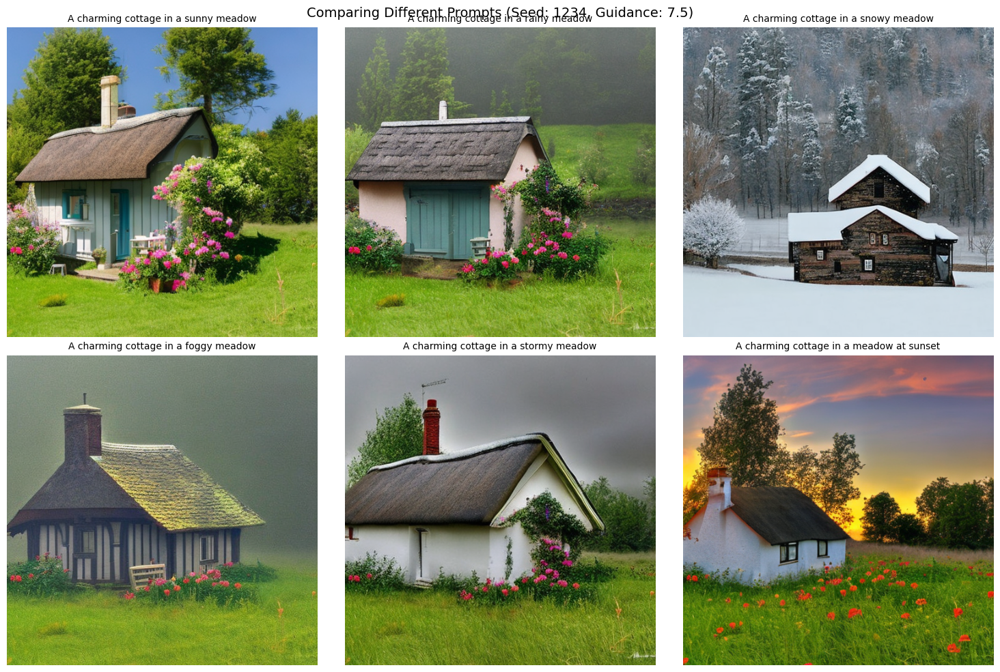

In [11]:
# Compare different prompts with the same seed
prompts = [
    "A charming cottage in a sunny meadow",
    "A charming cottage in a rainy meadow",
    "A charming cottage in a snowy meadow",
    "A charming cottage in a foggy meadow",
    "A charming cottage in a stormy meadow",
    "A charming cottage in a meadow at sunset"
]

compare_prompts(prompts, seed=1234, guidance_scale=7.5, num_inference_steps=30)

### 3.5 Exploring Guidance Scale

The guidance scale parameter controls how closely the generated image follows the text prompt. Let's explore its effect:

In [12]:
def compare_guidance_scales(prompt, guidance_scales, seed=42, num_inference_steps=30):
    """
    Generate and compare images with different guidance scales
    
    Args:
        prompt (str): Text prompt
        guidance_scales (list): List of guidance scale values to compare
        seed (int): Random seed for reproducibility
        num_inference_steps (int): Number of denoising steps
    """
    # Calculate grid dimensions
    n = len(guidance_scales)
    cols = min(3, n)  # Maximum 3 columns
    rows = (n + cols - 1) // cols  # Ceiling division
    
    # Generate and display images
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    if rows == 1 and cols == 1:
        axes = np.array([axes])  # Ensure axes is always iterable
    axes = axes.flatten()
    
    for i, guidance_scale in enumerate(guidance_scales):
        # Set the same random seed for all generations
        generator = torch.Generator(device=device).manual_seed(seed)
        
        # Generate image with the current guidance scale
        image = pipe(
            prompt,
            guidance_scale=guidance_scale,
            num_inference_steps=num_inference_steps,
            generator=generator
        ).images[0]
        
        # Display image
        axes[i].imshow(image)
        axes[i].set_title(f"Guidance Scale: {guidance_scale}", fontsize=12)
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
        fig.delaxes(axes[j])
    
    plt.suptitle(f"Effect of Guidance Scale on: {prompt}", fontsize=14)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

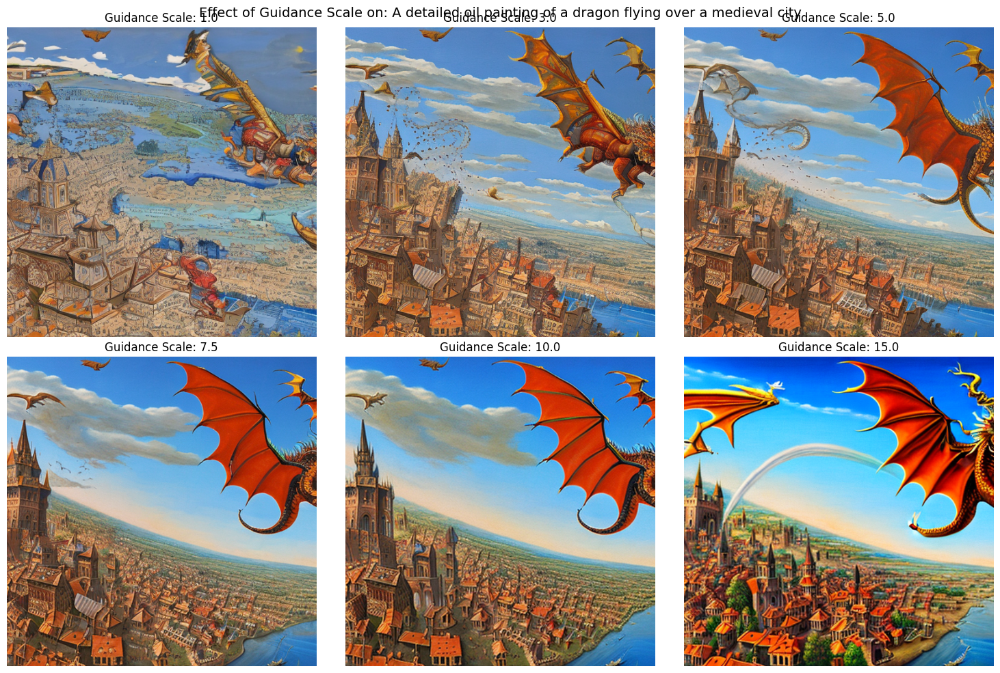

In [13]:
# Compare different guidance scale values
prompt = "A detailed oil painting of a dragon flying over a medieval city"
guidance_scales = [1.0, 3.0, 5.0, 7.5, 10.0, 15.0]

compare_guidance_scales(prompt, guidance_scales, seed=5678, num_inference_steps=30)

## 4. Evaluation of Diffusion Models

Evaluating generative models like diffusion models is challenging because the goal is to generate realistic and diverse samples rather than to predict a specific output. Here are some common evaluation metrics for diffusion models:

### 4.1 Quantitative Metrics

1. **Fréchet Inception Distance (FID)**: Measures the similarity between the distribution of generated images and real images. Lower FID scores indicate more realistic generations.

2. **Inception Score (IS)**: Evaluates both the quality and diversity of generated images. Higher IS values indicate better performance.

3. **CLIP Score**: For text-to-image models, measures how well the generated images match their text descriptions using CLIP embeddings.

4. **Perceptual Path Length (PPL)**: Measures the smoothness of the generator's latent space, with lower values indicating better quality.

### 4.2 Qualitative Evaluation

1. **Human Evaluation**: Having humans rate the quality and text-alignment of generated images.

2. **Diversity Assessment**: Visually inspecting multiple generations for the same prompt to assess diversity.

3. **Attribute Control**: Testing how well the model follows specific attributes mentioned in the text prompt.

4. **Robustness to Prompts**: Testing the model with various prompt formulations and complexities.

### 4.3 Implementing CLIP Score Evaluation

Let's implement a simple CLIP-based evaluation to measure how well our generated images match their text descriptions:

In [14]:
# Install additional package for CLIP evaluation
!pip install open-clip-torch==2.23.0

  Using cached open_clip_torch-2.23.0-py3-none-any.whl.metadata (30 kB)
  Using cached sentencepiece-0.2.0-cp312-cp312-win_amd64.whl.metadata (8.3 kB)
  Using cached protobuf-6.30.2-cp310-abi3-win_amd64.whl.metadata (593 bytes)
Using cached open_clip_torch-2.23.0-py3-none-any.whl (1.5 MB)
Using cached protobuf-6.30.2-cp310-abi3-win_amd64.whl (431 kB)
Using cached sentencepiece-0.2.0-cp312-cp312-win_amd64.whl (991 kB)
  Attempting uninstall: open-clip-torch
    Found existing installation: open_clip_torch 2.32.0
    Uninstalling open_clip_torch-2.32.0:
      Successfully uninstalled open_clip_torch-2.32.0



[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [15]:
import open_clip
import torchvision.transforms as transforms
from PIL import Image

def compute_clip_score(image, text):
    """
    Compute the CLIP score between an image and a text prompt
    
    Args:
        image (PIL.Image): The image to evaluate
        text (str): The text prompt
        
    Returns:
        float: The CLIP score (cosine similarity)
    """
    # Load CLIP model
    model, _, preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='openai')
    tokenizer = open_clip.get_tokenizer('ViT-B-32')
    model = model.to(device)
    
    # Preprocess image and text
    image_tensor = preprocess(image).unsqueeze(0).to(device)
    text_tokens = tokenizer([text]).to(device)
    
    # Compute embeddings
    with torch.no_grad():
        image_features = model.encode_image(image_tensor)
        text_features = model.encode_text(text_tokens)
        
        # Normalize features
        image_features = image_features / image_features.norm(dim=1, keepdim=True)
        text_features = text_features / text_features.norm(dim=1, keepdim=True)
        
        # Compute similarity (CLIP score)
        similarity = (image_features @ text_features.T).item()
    
    return similarity

def evaluate_generation(prompt, guidance_scale=7.5, num_inference_steps=30, seed=42):
    """
    Generate an image from a prompt and evaluate it using CLIP score
    
    Args:
        prompt (str): The text prompt
        guidance_scale (float): Controls how much the image generation follows the text
        num_inference_steps (int): Number of denoising steps
        seed (int): Random seed for reproducibility
    """
    # Set random seed
    generator = torch.Generator(device=device).manual_seed(seed)
    
    # Generate image
    image = pipe(
        prompt,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=generator
    ).images[0]
    
    # Compute CLIP score
    clip_score = compute_clip_score(image, prompt)
    
    # Display image with evaluation metrics
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Prompt: {prompt}\nCLIP Score: {clip_score:.4f}\nGuidance Scale: {guidance_scale}, Steps: {num_inference_steps}", fontsize=12)
    plt.show()
    
    return image, clip_score

C:\Users\deepa\Documents\Repo\diffusion_project\fresh_env\Lib\site-packages\timm\models\layers\__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


  0%|          | 0/30 [00:00<?, ?it/s]

100%|███████████████████████████████████████| 354M/354M [00:53<00:00, 6.64MiB/s]


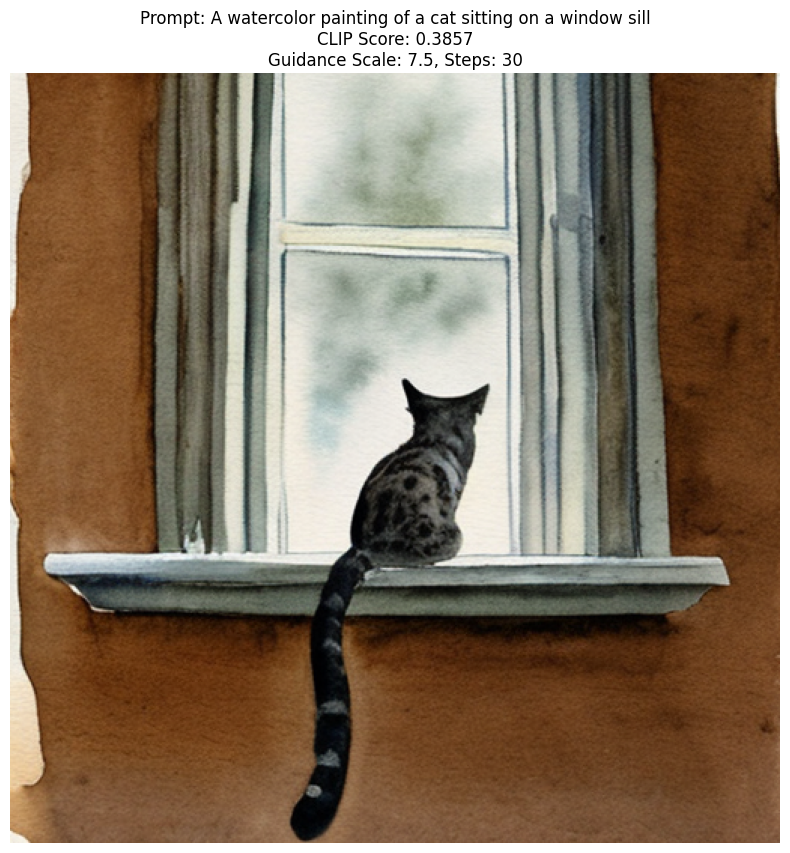

In [16]:
# Evaluate a generated image
prompt = "A watercolor painting of a cat sitting on a window sill"
image, clip_score = evaluate_generation(prompt, guidance_scale=7.5, num_inference_steps=30, seed=42)

### 4.4 Comparing CLIP Scores Across Guidance Scales

Let's use our CLIP-based evaluation to compare how different guidance scale values affect the text-image alignment:

In [17]:
def compare_and_evaluate_guidance_scales(prompt, guidance_scales, seed=42, num_inference_steps=30):
    """
    Generate and compare images with different guidance scales, evaluating with CLIP scores
    
    Args:
        prompt (str): Text prompt
        guidance_scales (list): List of guidance scale values to compare
        seed (int): Random seed for reproducibility
        num_inference_steps (int): Number of denoising steps
        
    Returns:
        list: CLIP scores for each guidance scale
    """
    # Calculate grid dimensions
    n = len(guidance_scales)
    cols = min(3, n)  # Maximum 3 columns
    rows = (n + cols - 1) // cols  # Ceiling division
    
    # Load CLIP model once
    model, _, preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='openai')
    tokenizer = open_clip.get_tokenizer('ViT-B-32')
    model = model.to(device)
    
    # Preprocess text once
    text_tokens = tokenizer([prompt]).to(device)
    with torch.no_grad():
        text_features = model.encode_text(text_tokens)
        text_features = text_features / text_features.norm(dim=1, keepdim=True)
    
    # Generate and display images
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    if rows == 1 and cols == 1:
        axes = np.array([axes])  # Ensure axes is always iterable
    axes = axes.flatten()
    
    clip_scores = []
    
    for i, guidance_scale in enumerate(guidance_scales):
        # Set the same random seed for all generations
        generator = torch.Generator(device=device).manual_seed(seed)
        
        # Generate image with the current guidance scale
        image = pipe(
            prompt,
            guidance_scale=guidance_scale,
            num_inference_steps=num_inference_steps,
            generator=generator
        ).images[0]
        
        # Compute CLIP score
        image_tensor = preprocess(image).unsqueeze(0).to(device)
        with torch.no_grad():
            image_features = model.encode_image(image_tensor)
            image_features = image_features / image_features.norm(dim=1, keepdim=True)
            similarity = (image_features @ text_features.T).item()
        
        clip_scores.append(similarity)
        
        # Display image
        axes[i].imshow(image)
        axes[i].set_title(f"Guidance Scale: {guidance_scale}\nCLIP Score: {similarity:.4f}", fontsize=12)
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
        fig.delaxes(axes[j])
    
    plt.suptitle(f"Effect of Guidance Scale on: {prompt}", fontsize=14)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()
    
    # Plot CLIP scores
    plt.figure(figsize=(10, 6))
    plt.plot(guidance_scales, clip_scores, marker='o', linestyle='-', linewidth=2, markersize=8)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xlabel('Guidance Scale', fontsize=12)
    plt.ylabel('CLIP Score', fontsize=12)
    plt.title(f'CLIP Score vs Guidance Scale for: "{prompt}"', fontsize=14)
    plt.xticks(guidance_scales)
    plt.tight_layout()
    plt.show()
    
    return clip_scores

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

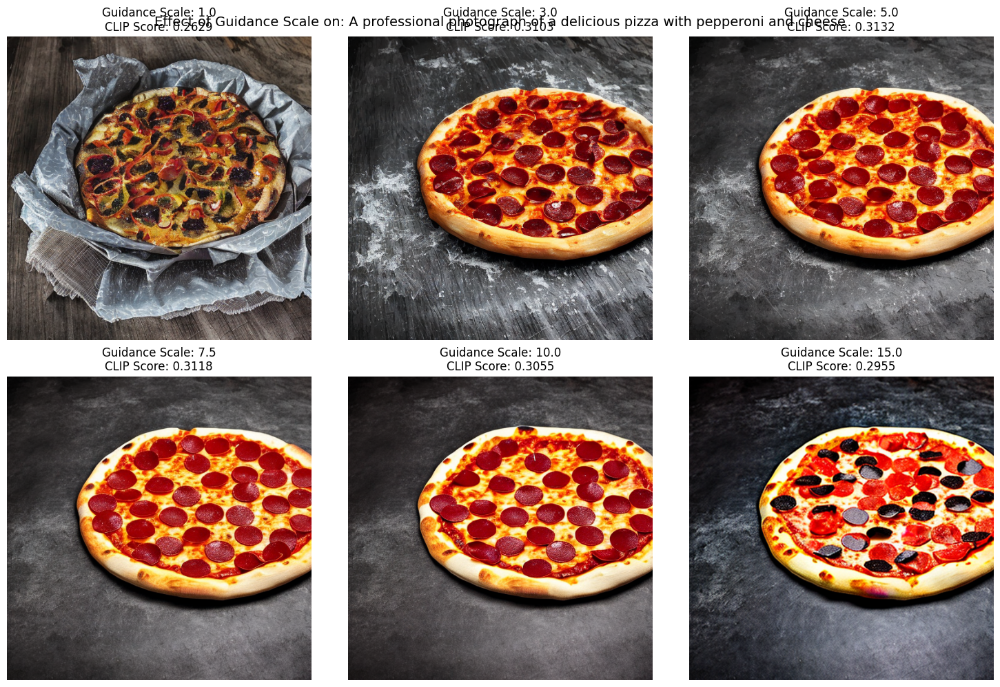

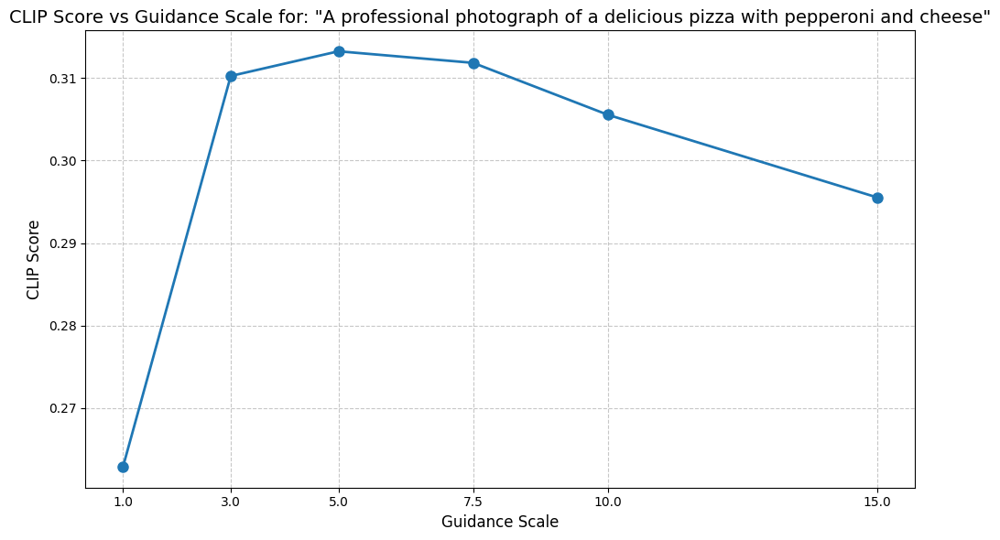

In [18]:
# Compare and evaluate different guidance scale values
prompt = "A professional photograph of a delicious pizza with pepperoni and cheese"
guidance_scales = [1.0, 3.0, 5.0, 7.5, 10.0, 15.0]

clip_scores = compare_and_evaluate_guidance_scales(prompt, guidance_scales, seed=123, num_inference_steps=30)

## 5. Advanced Topics

### 5.1 Controlling Image Generation

Stable Diffusion models can be controlled through various techniques beyond just text prompts. Let's explore a few methods to guide the generation process.

#### 5.1.1 Negative Prompting

Negative prompts tell the model what to avoid in the generated image:

In [19]:
def generate_with_negative_prompt(prompt, negative_prompt, guidance_scale=7.5, num_inference_steps=30, seed=42):
    """
    Generate an image with both positive and negative prompting
    
    Args:
        prompt (str): The text prompt
        negative_prompt (str): Elements to avoid in the generation
        guidance_scale (float): Controls how much the image generation follows the text
        num_inference_steps (int): Number of denoising steps
        seed (int): Random seed for reproducibility
    """
    # Set random seed
    generator = torch.Generator(device=device).manual_seed(seed)
    
    # Generate image with negative prompt
    image = pipe(
        prompt,
        negative_prompt=negative_prompt,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=generator
    ).images[0]
    
    # Display image with prompting information
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Prompt: {prompt}\nNegative Prompt: {negative_prompt}\nGuidance Scale: {guidance_scale}, Steps: {num_inference_steps}", fontsize=12)
    plt.show()
    
    return image

  0%|          | 0/30 [00:00<?, ?it/s]

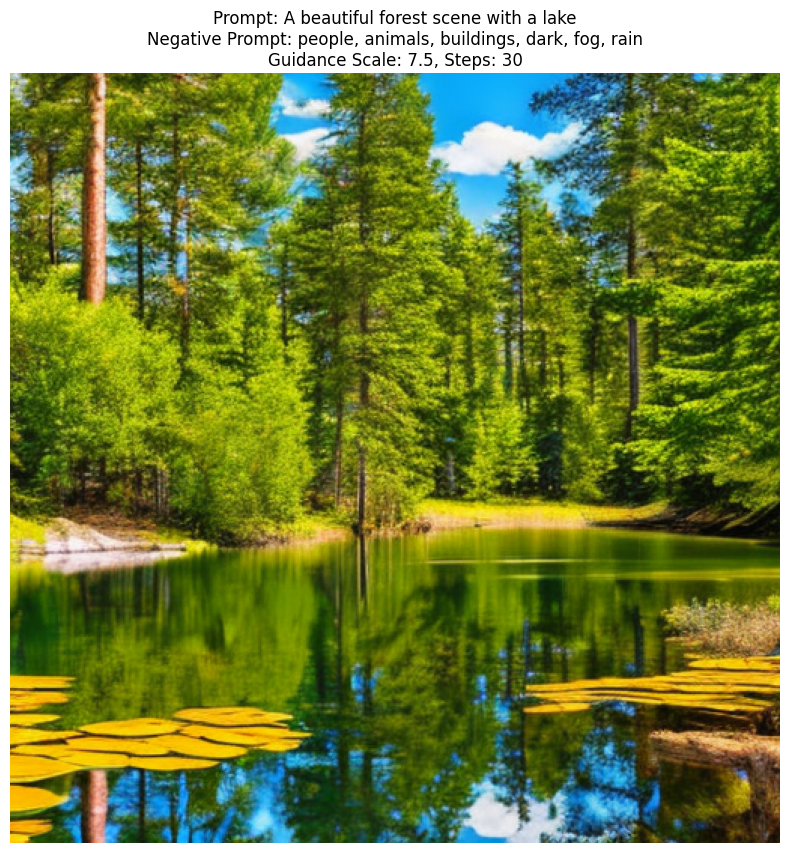

In [20]:
# Generate with negative prompting
prompt = "A beautiful forest scene with a lake"
negative_prompt = "people, animals, buildings, dark, fog, rain"
image = generate_with_negative_prompt(prompt, negative_prompt, guidance_scale=7.5, num_inference_steps=30, seed=42)

### 5.2 Applications of Text-to-Image Diffusion Models

Text-to-image diffusion models have numerous applications across various industries:

#### 5.2.1 Creative Industries

- **Concept Art Generation**: Quickly creating visual concepts for games, films, and other media
- **Advertising and Marketing**: Generating custom imagery for campaigns
- **Design Inspiration**: Providing visual starting points for designers
- **Book/Comic Illustration**: Creating illustrations based on written descriptions
- **Fashion Design**: Generating new clothing designs or patterns

#### 5.2.2 Educational Applications

- **Visual Learning Aids**: Creating custom visuals to illustrate concepts
- **Historical Visualization**: Generating images of historical scenes based on descriptions
- **Scientific Visualization**: Illustrating scientific concepts or hypothetical scenarios

#### 5.2.3 Accessibility

- **Visual Storytelling**: Helping individuals with limited artistic skills to visualize their ideas
- **Assistive Technology**: Helping people with certain disabilities to communicate visually

#### 5.2.4 Research and Development

- **Data Augmentation**: Generating additional training data for computer vision models
- **Synthetic Data Generation**: Creating realistic but privacy-preserving data
- **Rapid Prototyping**: Quickly visualizing product concepts

## 6. Ethical Considerations

Text-to-image diffusion models raise several important ethical considerations:

### 6.1 Potential Misuse

- **Deepfakes and Misinformation**: These models could be used to create convincing but false images
- **Copyright and Intellectual Property**: Questions about ownership of AI-generated content
- **Privacy Concerns**: Potential for generating images that violate privacy rights

### 6.2 Bias and Representation

- **Training Data Bias**: Models may perpetuate or amplify biases present in their training data
- **Cultural Representation**: Models may not represent diverse cultural perspectives equally
- **Stereotyping**: Risk of reinforcing harmful stereotypes in generated images

### 6.3 Economic Impact

- **Artistic Profession Disruption**: Potential impact on professional artists and designers
- **Content Devaluation**: Possible devaluation of human-created content

### 6.4 Mitigation Strategies

- **Safety Mechanisms**: Implementing content filters and safety checks
- **Transparent Development**: Being open about model limitations and biases
- **Stakeholder Engagement**: Involving diverse stakeholders in model development
- **Education and Awareness**: Promoting responsible use through education
- **Watermarking**: Adding digital watermarks to AI-generated content

## 7. Conclusion

In this notebook, we've explored text-to-image generation with diffusion models, covering both theoretical foundations and practical implementation. We've learned about:

1. **Core Principles**: The forward and reverse diffusion processes that form the foundation of diffusion models
2. **Architecture**: The U-Net backbone with attention mechanisms for text conditioning
3. **Training and Sampling**: How diffusion models are trained and how to generate images using them
4. **Implementation**: Practical code examples using Stable Diffusion for text-to-image generation
5. **Evaluation**: Methods to assess the quality and text-alignment of generated images
6. **Advanced Techniques**: Ways to control and guide the generation process
7. **Applications and Ethics**: Potential use cases and ethical considerations

Diffusion models represent one of the most exciting advances in generative AI, enabling creative applications while raising important questions about responsibility and ethics. As these models continue to evolve, they promise to transform how we create and interact with visual content across numerous domains.

The field of text-to-image generation is rapidly advancing, with improvements in resolution, fidelity, and control. Future developments may include more precise control over image content, better understanding of complex prompts, and integration with other media types for multimodal generation.

## 8. References

1. Ho, J., Jain, A., & Abbeel, P. (2020). Denoising Diffusion Probabilistic Models. *Advances in Neural Information Processing Systems*.

2. Dhariwal, P., & Nichol, A. (2021). Diffusion Models Beat GANs on Image Synthesis. *Advances in Neural Information Processing Systems*.

3. Rombach, R., Blattmann, A., Lorenz, D., Esser, P., & Ommer, B. (2022). High-Resolution Image Synthesis with Latent Diffusion Models. *Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition*.

4. Nichol, A., Dhariwal, P., Ramesh, A., Shyam, P., Mishkin, P., McGrew, B., Sutskever, I., & Chen, M. (2021). GLIDE: Towards Photorealistic Image Generation and Editing with Text-Guided Diffusion Models. *arXiv preprint arXiv:2112.10741*.

5. Saharia, C., Chan, W., Saxena, S., Li, L., Whang, J., Denton, E., ... & Norouzi, M. (2022). Photorealistic Text-to-Image Diffusion Models with Deep Language Understanding. *Advances in Neural Information Processing Systems*.

6. Hugging Face Diffusers Documentation. https://huggingface.co/docs/diffusers/

7. Stable Diffusion - CompVis, Stability AI, and LAION. https://stability.ai/stable-diffusion

8. Hessel, J., Holtzman, A., Forbes, M., Bhupatiraju, R., Lipton, Z., Ren, J., ... & Choi, Y. (2022). CLIPScore: A Reference-free Evaluation Metric for Image Captioning. *arXiv preprint arXiv:2104.08718*.

## 9. License

This notebook is licensed under the MIT License.

Copyright (c) 2025

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.